In [1]:
import numpy as np
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
from scipy.io.wavfile import write
import librosa

In [3]:
music_file = "Signals/Music/Scarborough Fair.wav"
music_audio, sr = librosa.load(music_file)

In [12]:
def play_audio(audio_data, sample_rate=sr):
    # normalized_audio = np.int16(audio_data / np.max(np.abs(audio_data)) * 32767)
    normalized_audio = np.int16(audio_data * 32767)

    write("temp_audio.wav", sample_rate, normalized_audio)
    return ipd.Audio("temp_audio.wav")

def plot_signal(signal, _sr=sr):
    duration = len(signal) / _sr
    time = np.linspace(0., duration, len(signal))
    plt.plot(time, signal)
    plt.xlabel('Time [s]')
    plt.ylabel('Amplitude')
    plt.grid()
    plt.show()

def plot_spectrogram(signal, _sr=sr):
    S = np.abs(librosa.stft(signal))
    S_db = librosa.amplitude_to_db(S, ref=np.max)

    plt.figure(figsize=(10, 6))
    librosa.display.specshow(S_db, sr=_sr, x_axis="time", y_axis="log", cmap='magma')
    # set y limit to 2000, and plot in log scale
    plt.ylim(0, 8000)
    plt.colorbar(label="Intensity [dB]")
    plt.title("Spectrogram")
    plt.xlabel("Time [s]")
    plt.ylabel("Frequency [Hz]")
    plt.show()

def extract_period(audio_data, start_time, end_time, sample_rate=sr):
    start_sample = int(start_time * sample_rate)
    end_sample = int(end_time * sample_rate)
    return audio_data[start_sample:end_sample]

def plot_magnitude_spectrum(ft, freqs):
    plt.plot(freqs, np.abs(ft))
    plt.xlabel('Frequency [Hz]')
    plt.ylabel('Magnitude')
    plt.grid()
    plt.show()

In [5]:
def filter_ranges(signal, ranges):
    ft = np.fft.fft(signal)
    ft = np.fft.fftshift(ft)
    freqs = np.fft.fftfreq(len(ft), 1/sr)
    freqs = np.fft.fftshift(freqs)
    for r in ranges:
        ft[(freqs >= r[0]) & (freqs <= r[1])] = 0
        ft[(freqs <= -r[0]) & (freqs >= -r[1])] = 0

    # plot_magnitude_spectrum(ft, freqs)
    ft = np.fft.ifftshift(ft)
    return np.fft.ifft(ft).real

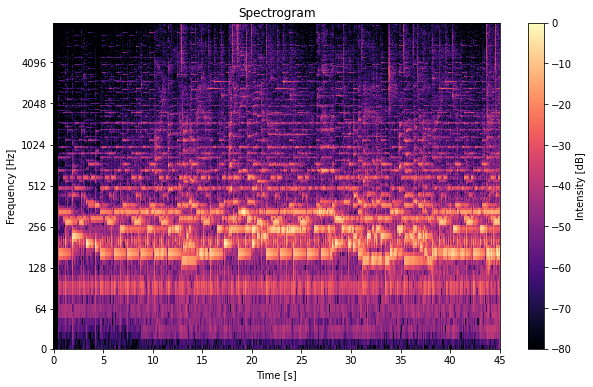

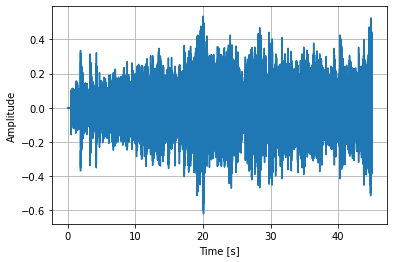

In [6]:
plot_spectrogram(music_audio)
plot_signal(music_audio)
play_audio(music_audio)

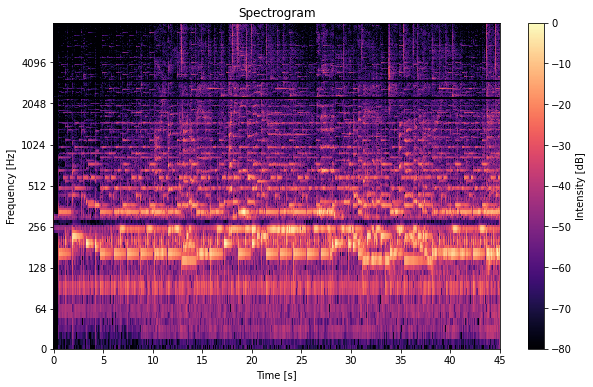

In [7]:
ee_formants = [(250, 300), (2200, 2300), (2950, 3050)]
ee_filtered = filter_ranges(music_audio, ee_formants)
plot_spectrogram(ee_filtered)
play_audio(ee_filtered)

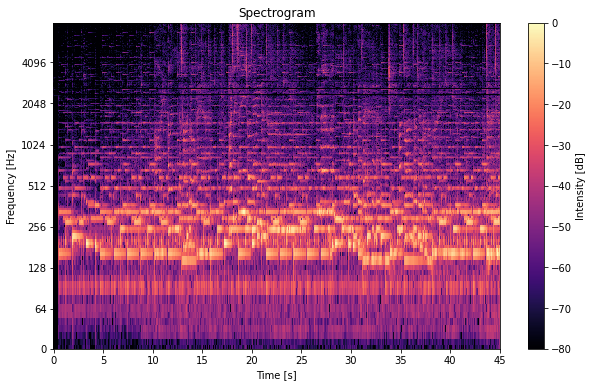

In [8]:
xylophone_ranges = [(3120, 3180), (2600, 2680), (2950, 3000), (2330, 2400)]
xylophone_filtered = filter_ranges(music_audio, xylophone_ranges)
plot_spectrogram(xylophone_filtered)
play_audio(xylophone_filtered)

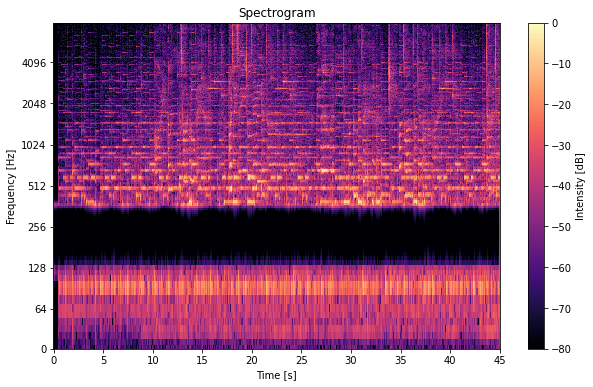

In [13]:
guitar_ranges = [(170, 280), (275, 370), (120, 190)]
guitar_filtered = filter_ranges(music_audio, guitar_ranges)
plot_spectrogram(guitar_filtered)
play_audio(guitar_filtered)